In [1]:
import tensorflow as tf
import matplotlib as mpl
import matplotlib.pyplot as plt

mpl.rcParams['figure.figsize'] = (8, 8)
mpl.rcParams['axes.grid'] = False

#Importando el model preentrenado MobileNetV2


In [2]:
pretrained_model = tf.keras.applications.MobileNetV2(include_top=True,
                                                     weights='imagenet')
pretrained_model.trainable = False

# ImageNet labels
decode_predictions = tf.keras.applications.mobilenet_v2.decode_predictions

14548992/14536120 [==============================] - 1s 0us/step


## Función para preprocesar las imágenes para MobileNetV2

In [3]:
# Helper function to preprocess the image so that it can be inputted in MobileNetV2
def preprocess(image):
  image = tf.cast(image, tf.float32)
  image = tf.image.resize(image, (224, 224))
  image = tf.keras.applications.mobilenet_v2.preprocess_input(image)
  image = image[None, ...]
  return image

# Helper function to extract labels from probability vector
def get_imagenet_label(probs):
  return decode_predictions(probs, top=1)[0][0]

# Graficando la imagen original

In [4]:
image_path = tf.keras.utils.get_file('tortoise-ground-species-Galapagos-Islands-home-archipelago.jpg', 'https://i.ibb.co/hYqynKp/tortoise-ground-species-Galapagos-Islands-home-archipelago.jpg')
image_raw = tf.io.read_file(image_path)
image = tf.image.decode_image(image_raw)

image = preprocess(image)
image_probs = pretrained_model.predict(image)

237568/226895 [===============================] - 0s 2us/step


49152/35363 [=========================================] - 0s 0us/step


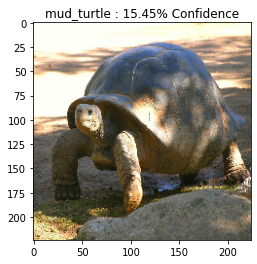

In [5]:
plt.figure()
plt.imshow(image[0] * 0.5 + 0.5)  # To change [-1, 1] to [0,1]
_, image_class, class_confidence = get_imagenet_label(image_probs)
plt.title('{} : {:.2f}% Confidence'.format(image_class, class_confidence*100))
plt.show()

#Creando el filtro para generar ejemplos adversarios

In [6]:
loss_object = tf.keras.losses.CategoricalCrossentropy()

def create_adversarial_pattern(input_image, input_label):
  with tf.GradientTape() as tape:
    tape.watch(input_image)
    prediction = pretrained_model(input_image)
    loss = loss_object(input_label, prediction)

  # Get the gradients of the loss w.r.t to the input image.
  gradient = tape.gradient(loss, input_image)
  # Get the sign of the gradients to create the perturbation
  signed_grad = tf.sign(gradient)
  return signed_grad


## Visualizando el filtro

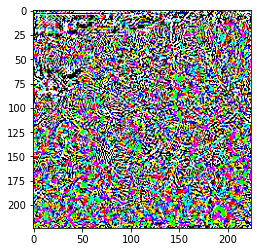

In [7]:
# Get the input label of the image.
labrador_retriever_index = 208
max = tf.reduce_max(image_probs)
index = 0
for i in range(image_probs.shape[1]):
  if image_probs[0,i] == max:
    index = i
    break

    
label = tf.one_hot(index, image_probs.shape[-1])
label = tf.reshape(label, (1, image_probs.shape[-1]))

perturbations = create_adversarial_pattern(image, label)
plt.imshow(perturbations[0] * 0.5 + 0.5);  # To change [-1, 1] to [0,1]

### Función para graficar las imágenes fácilmente

In [8]:
wdef display_images(image, description):
  _, label, confidence = get_imagenet_label(pretrained_model.predict(image))
  plt.figure()
  plt.imshow(image[0]*0.5+0.5)
  plt.title('{} \n {} : {:.2f}% Confidence'.format(description,
                                                   label, confidence*100))
  plt.show()

#Construyendo los ejemplos adversarios

###FSGM

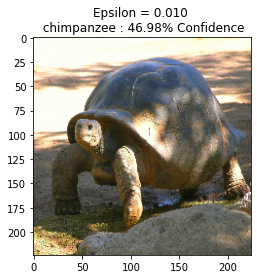

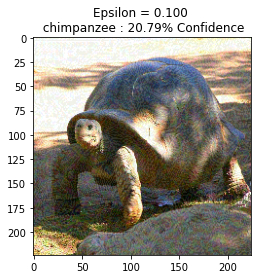

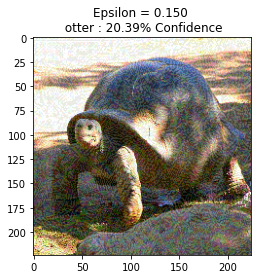

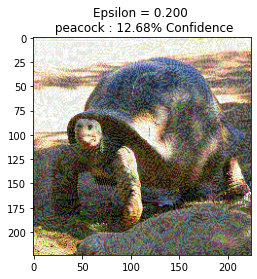

In [9]:
epsilons = [0.01, 0.1, 0.15, 0.2]
descriptions = [('Epsilon = {:0.3f}'.format(eps) if eps else 'Input')
                for eps in epsilons]
perturbations = create_adversarial_pattern(image, label)
for i, eps in enumerate(epsilons):
  adv_x = image + eps*perturbations
  adv_x = tf.clip_by_value(adv_x, -1, 1)
  display_images(adv_x, descriptions[i])


###PGD

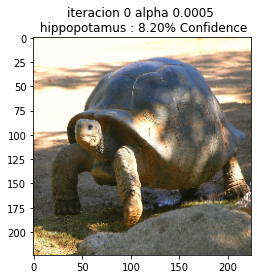

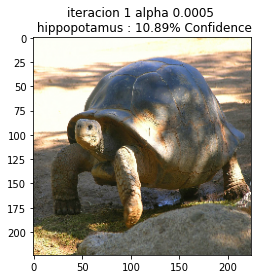

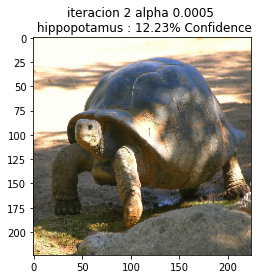

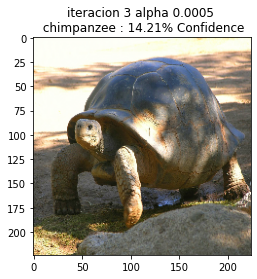

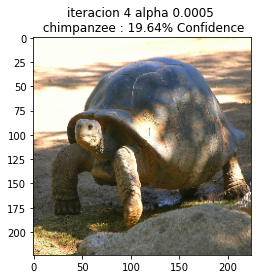

...

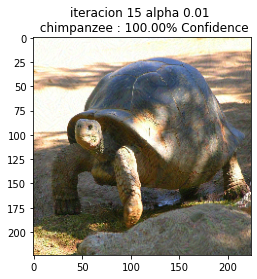

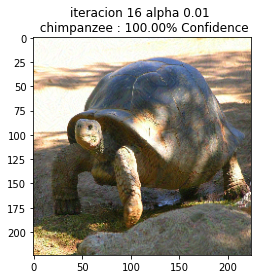

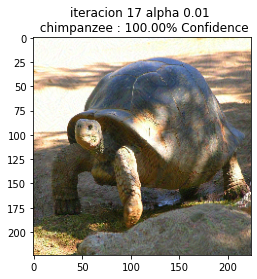

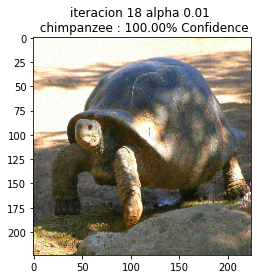

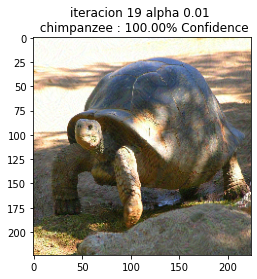

In [15]:
iterations = 20
perturbations = create_adversarial_pattern(image, label)
for epsilon in epsilons:
  alpha = epsilon/iterations
  adv_x = image + alpha * perturbations
  for i in range(iterations):
    img = tf.clip_by_value(adv_x, -1, 1)
    display_images(img, f'iteracion {i} alpha {alpha}')
    perturbations = create_adversarial_pattern(adv_x, label)
    if i+1 == 5 or i+1 == 10 or i+1 == 15 or i+1 == 20:
      plt.imshow(perturbations[0] * 0.5 + 0.5);
    adv_x =  adv_x + alpha * perturbations

#Comparando tiempo de cómputo

###FSGM

In [11]:
import time 
import numpy as np
perturbations = create_adversarial_pattern(image, label)

t_fsgm = []
t_0 = time.perf_counter()
for i, eps in enumerate(epsilons):
  adv_x = image + eps*perturbations
  t_fsgm += [time.perf_counter()-t_0]

t_fsgm = np.array(t_fsgm)
print(f'Media de FSGM {t_fsgm.mean()} std {t_fsgm.std()}')

Media de FSGM 0.0008694592500049225 std 0.00023179772738795497


### PGD

In [20]:
import time 
import numpy as np
t_pgd = {}
for epsilon in epsilons:
  t_0 = time.perf_counter()
  t = []
  alpha = epsilon/iterations
  adv_x = image + alpha * perturbations
  for i in range(iterations):
    perturbations = create_adversarial_pattern(adv_x, label)
    if (i + 1 ) % 5 == 0:
      t += [time.perf_counter() - t_0]
    adv_x =  adv_x + alpha * perturbations
  t_pgd[alpha] = np.array(t)


pgd_5_seconds = []
pgd_10_seconds = []
pgd_20_seconds = []

alphas = []
for epsilon in epsilons:
  alphas += [epsilon /20]
  
for alpha in alphas:
  fgd_time_iteration = t_pgd[alpha]
  pgd_5_seconds += [fgd_time_iteration[0]]
  pgd_10_seconds += [fgd_time_iteration[1]]
  pgd_20_seconds += [fgd_time_iteration[3]]

pgd_5_seconds = np.array(pgd_5_seconds)
pgd_10_seconds = np.array(pgd_10_seconds)
pgd_20_seconds = np.array(pgd_20_seconds)

print(f'PGD time 5 seconds mean {pgd_5_seconds.mean()}, std {pgd_5_seconds.std()}')
print(f'PGD time 10 seconds mean {pgd_10_seconds.mean()}, std {pgd_10_seconds.std()}')
print(f'PGD time 20 seconds mean {pgd_20_seconds.mean()}, std {pgd_20_seconds.std()}')


PGD time 5 seconds mean 0.5230505875000517, std 0.012793160989008024
PGD time 10 seconds mean 1.0399811725000632, std 0.016291743519181747
PGD time 20 seconds mean 2.079036013749999, std 0.024018148291806384


# Comparando efectividad de los métodos

###FSGM

In [13]:
import numpy as np
confidence = []
correct_label = 'beagle'
perturbations = create_adversarial_pattern(image, label)
for i, eps in enumerate(epsilons):
  adv_x = image + eps*perturbations
  _, predicted_label, c = get_imagenet_label(pretrained_model.predict(adv_x))
  if predicted_label == correct_label:
    confidence += [-c]
  else:
    confidence += [c]

confidence = np.array(confidence)
print(f'Confidence FSGM mean {confidence.mean()}, std {confidence.std()}')

Confidence FSGM mean 0.27347037196159363, std 0.11336074024438858


### PGD

In [23]:
import numpy as np
perturbations = create_adversarial_pattern(image, label)
real_label = 'mud_turtle'

t_pgd = {}
t_0 = time.perf_counter()

confidence_5 = []
confidence_10 = []
confidence_20 = []

alphas = []
for epsilon in epsilons:
  alphas += [epsilon /20]

for alpha in alphas:
  adv_x = image + alpha * perturbations
  for i in range(iterations):
    perturbations = create_adversarial_pattern(adv_x, label)
    if (i + 1 ) % 5 == 0:
      t += [time.perf_counter() - t_0]
    _, predicted_label, c = get_imagenet_label(pretrained_model.predict(adv_x))
    if i+1 == 5:
      if predicted_label == real_label:
        confidence_5 += [-c]
      else:
        confidence_5 += [c]

    if i+1 == 10:
      if predicted_label == real_label:
        confidence_10 += [-c]
      else:
        confidence_10 += [c]

    if i+1 == 20:
      if predicted_label == real_label:
        confidence_20 += [-c]
      else:
        confidence_20 += [c]
    adv_x =  adv_x + alpha * perturbations


confidence_5 = np.array(confidence_5)
confidence_10 = np.array(confidence_10)
confidence_20 = np.array(confidence_20)
print(f'confidence 5 mean {confidence_5.mean()} std {confidence_5.std()}')
print(f'confidence 10 mean {confidence_10.mean()} std {confidence_10.std()}')
print(f'confidence 20 mean {confidence_20.mean()} std {confidence_20.std()}')


confidence 5 mean 0.7989348769187927 std 0.34718215465545654
confidence 10 mean 0.9398671388626099 std 0.10408051311969757
confidence 20 mean 0.9997807741165161 std 0.00037842962774448097


#Referencias
Para la realización del código se tomó en base el mostrado en https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/tutorials/generative/adversarial_fgsm.ipynb , en donde se muestra cómo implementar un filtro FSGM. 